In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '4'

from pytorch_lightning import utilities as pl_utils
from pytorch_lightning.trainer.trainer import Trainer
from pytorch_lightning.plugins import DDPPlugin
import torch
import pathlib
from functools import partial
import sys, glob, copy
import numpy as np

sys.path.append('..')
sys.path.append('../deep-learning-base')
sys.path.append('../partially_inverted_reps')

import plot_helper as plt_hp
import output as out
from training import LitProgressBar, NicerModelCheckpointing
import training.finetuning as ft
import architectures as arch
from architectures.callbacks import LightningWrapper, LinearEvalWrapper
from attack.callbacks import AdvCallback
from datasets.data_modules import DATA_MODULES
import datasets.dataset_metadata as dsmd
from partial_loss import PartialInversionLoss, PartialInversionRegularizedLoss
from __init__ import DATA_PATH_IMAGENET, DATA_PATH, SERVER_PROJECT_PATH
from human_nn_alignment.save_inverted_reps import save_batched_images, get_classes_names

/NS/twitter_archive2/work/vnanda/minconda3/envs/dl_base/lib/python3.7/site-packages/paramiko/transport.py:236: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [2]:
CHECKPOINT_PATHS = {
    'resnet50': {
        'nonrob': '',
        'robustl2eps3': '/NS/robustness_3/work/vnanda/adv-robustness/logs/'\
                        'robust_imagenet/eps3/resnet-50-l2-eps3.ckpt'},
    'resnet50_mrl': {
        'nonrob': '/NS/robustness_2/work/vnanda/invariances_in_reps/deep-learning-base/checkpoints'\
                  '/imagenet1k/r50_mrl1_e0_ff2048.pt'
    },
    'vit_small_patch16_224': {
        'nonrob': \
            '/NS/robustness_2/work/vnanda/invariances_in_reps/deep-learning-base/checkpoints/imagenet21k/'\
            'S_16-i21k-300ep-lr_0.001-aug_light1-wd_0.03-do_0.0-sd_0.0.npz'
        },
    'vit_small_patch32_224': {
        'nonrob': \
            '/NS/robustness_2/work/vnanda/invariances_in_reps/deep-learning-base/checkpoints/imagenet21k/'\
            'S_32-i21k-300ep-lr_0.001-aug_light1-wd_0.03-do_0.0-sd_0.0.npz'
        }
}

SEED = 2
NUM_NODES = 1
DEVICES = 1
BASE_DIR = f"{pathlib.Path('.').parent.resolve()}/checkpoints"

FINETUNING_DATASETS = ['cifar10', 'cifar100', 'flowers', 'oxford-iiit-pets']
FINETUNE_MODE = 'random'
FINETUNE_BS = 256
EVAL_BATCH_SIZE = 200

In [3]:
def load_linear_weights(model, state_dict):
    linear_layer = list(model.named_modules())[-1][1]
    linear_layer.load_state_dict({'.'.join(k.split('.')[-1:]):v \
                                  for k,v in state_dict['state_dict'].items()}, strict=True)
    if hasattr(linear_layer, 'neuron_indices') and 'neuron_indices' in state_dict:
        assert torch.all(linear_layer.neuron_indices == state_dict['neuron_indices'])

In [5]:
def get_test_pred_overlap(model, source_dataset, finetuning_dataset, 
                          checkpoint_path, seeds, fraction, append):
    dm = DATA_MODULES[finetuning_dataset](
        data_dir=DATA_PATH_IMAGENET if 'imagenet' in finetuning_dataset else DATA_PATH,
        transform_train=dsmd.TRAIN_TRANSFORMS_TRANSFER_DEFAULT(224),
        transform_test=dsmd.TEST_TRANSFORMS_DEFAULT(224),
        batch_size=EVAL_BATCH_SIZE)
    dm.init_remaining_attrs(source_dataset)

    ## assign mean and std from source dataset
    m1 = arch.create_model(model, source_dataset, pretrained=True,
                           checkpoint_path=checkpoint_path, seed=SEED, 
                           num_classes=dsmd.DATASET_PARAMS[source_dataset]['num_classes'],
                           callback=partial(LightningWrapper, 
                                            dataset_name=source_dataset,
                                            inference_kwargs={'with_latent': True, 'with_x': True}))
    model1_path = [x for x in glob.glob(f'{BASE_DIR}/{model}-base-{source_dataset}-ft-{finetuning_dataset}/'
                                           f'frac-{fraction:.5f}-mode-{FINETUNE_MODE}-seed-{seeds[0]}-'
                                           f'ftmode-linear-lr-*-bs*-{append}/'
                                           '*-topk=1.ckpt') \
                  if '.add' not in x.split('/')[-1] and \
                     '.pool' not in x.split('/')[-1] and \
                     '.act3' not in x.split('/')[-1] and \
                     'full-feature' not in x.split('/')[-1]]
    sd_1 = torch.load(model1_path[0])
    model2_path = [x for x in glob.glob(f'{BASE_DIR}/{model}-base-{source_dataset}-ft-{finetuning_dataset}/'
                                           f'frac-{fraction:.5f}-mode-{FINETUNE_MODE}-seed-{seeds[1]}-'
                                           f'ftmode-linear-lr-*-bs*-{append}/'
                                           '*-topk=1.ckpt') \
                  if '.add' not in x.split('/')[-1] and \
                     '.pool' not in x.split('/')[-1] and \
                     '.act3' not in x.split('/')[-1] and \
                     'full-feature' not in x.split('/')[-1]]
    sd_2 = torch.load(model2_path[0])
    modelfull_path = [x for x in glob.glob(f'{BASE_DIR}/{model}-base-{source_dataset}-ft-{finetuning_dataset}/'
                                           f'frac-{1.0:.5f}-mode-{FINETUNE_MODE}-seed-2-'
                                           f'ftmode-linear-lr-*-bs*-{append}/'
                                           '*-topk=1.ckpt') \
                  if '.add' not in x.split('/')[-1] and \
                     '.pool' not in x.split('/')[-1] and \
                     '.act3' not in x.split('/')[-1] and \
                     'full-feature' not in x.split('/')[-1]]
    sd_full = torch.load(modelfull_path[0])

    m_seed1 = copy.deepcopy(m1)
    layer1 = ft.setup_model_for_finetuning(
        m_seed1.model, 
        dsmd.DATASET_PARAMS[finetuning_dataset]['num_classes'],
        FINETUNE_MODE, fraction, seeds[0], inplace=True)
    load_linear_weights(m_seed1.model, sd_1)
    
    m_seed2 = copy.deepcopy(m1)
    layer2 = ft.setup_model_for_finetuning(
        m_seed2.model, 
        dsmd.DATASET_PARAMS[finetuning_dataset]['num_classes'],
        FINETUNE_MODE, fraction, seeds[1], inplace=True)
    load_linear_weights(m_seed2.model, sd_2)
    
    layer_full = ft.setup_model_for_finetuning(
        m1.model, 
        dsmd.DATASET_PARAMS[finetuning_dataset]['num_classes'],
        FINETUNE_MODE, 1.0, 2, inplace=True)
    load_linear_weights(m1.model, sd_full)
    
    pl_utils.seed.seed_everything(SEED, workers=True)

    trainer = Trainer(accelerator='gpu', 
                      devices=DEVICES,
                      num_nodes=NUM_NODES,
                      log_every_n_steps=1,
                      auto_select_gpus=True, 
                      deterministic=True,
                      check_val_every_n_epoch=1,
                      num_sanity_val_steps=0,
                      callbacks=[LitProgressBar(['loss', 'running_test_acc'])])
    out1 = trainer.predict(m_seed1, dataloaders=[dm.test_dataloader()])
    out2 = trainer.predict(m_seed2, dataloaders=[dm.test_dataloader()])
    out_full = trainer.predict(m1, dataloaders=[dm.test_dataloader()])
    return out1, out2, out_full

In [6]:
def results(model, source_dataset):
    plt_str = '== Error Profiles ==\n\n'
    for append in CHECKPOINT_PATHS[model].keys():
        plt_str += f'=== {model} - {append} ===\n\n'
        for ft_ds in FINETUNING_DATASETS:
            plt_str += f'==== {ft_ds} ====\n\n'
            PARTIAL_FRACTIONS = sorted(
                list(set(
                    [float(x.split('/frac-')[1].split('-')[0]) for x in \
                        glob.glob(f'./checkpoints/{model}-base-'
                                  f'{source_dataset}-ft-{ft_ds}/'
                                  f'*-bs-256-{append}/*') \
                     if '.add' not in x.split('/')[-1] and \
                        '.pool' not in x.split('/')[-1] and \
                        '.act3' not in x.split('/')[-1] and \
                        'full-feature' not in x.split('/')[-1]]
                    )))
            for frac in PARTIAL_FRACTIONS[:-1]: # exclude the full layer
                out1, out2, out_full = get_test_pred_overlap(model, source_dataset, ft_ds, 
                                                             CHECKPOINT_PATHS[model][append], 
                                                             [1,2], frac, append)
                gt1, pred1 = out1[2], torch.argmax(out1[0], 1)
                gt2, pred2 = out2[2], torch.argmax(out2[0], 1)
                gtfull, predfull = out_full[2], torch.argmax(out_full[0], 1)
                print (f'For {model}-{append} on {ft_ds}, frac={frac} '
                       f'Test acc partial heads: {torch.sum(gt1 == pred1) / len(gt1)}, '
                       f'{torch.sum(gt2 == pred2) / len(gt2)}; '
                       f'full head: {torch.sum(gtfull == predfull) / len(gtfull)}')
                assert torch.all(gt1 == gt2) and torch.all(gt2 == gtfull)
                correct1 = set(torch.where(gt1 == pred1)[0].cpu().numpy())
                correct2 = set(torch.where(gt2 == pred2)[0].cpu().numpy())
                correctfull = set(torch.where(gtfull == predfull)[0].cpu().numpy())
                indices_fullonly = list(correctfull - correct1 - correct2)
                indices_head1 = list(correct1 - correctfull - correct2)
                indices_head2 = list(correct2 - correctfull - correct1)
                inputs_correct_fullonly = out1[3][indices_fullonly]
                inputs_correct_head1 = out1[3][indices_head1]
                inputs_correct_head2 = out1[3][indices_head2]
                
                class_names = get_classes_names(ft_ds, DATA_PATH_IMAGENET \
                                                if 'imagenet' in ft_ds else DATA_PATH)
                if len(inputs_correct_fullonly) <= 1000:
                    save_batched_images(f'./{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/'
                                        f'{source_dataset}/{model}-{frac:.5f}-{ft_ds}-{append}', 
                                        inputs_correct_fullonly, indices_fullonly, gt1[indices_fullonly], 
                                        class_names, '_correct_fullonly')
                if len(inputs_correct_head1) <= 1000:
                    save_batched_images(f'./{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/'
                                        f'{source_dataset}/{model}-{frac:.5f}-{ft_ds}-{append}', 
                                        inputs_correct_head1, indices_head1, gt1[indices_head1], 
                                        class_names, '_correct_head1')
                if len(inputs_correct_head2) <= 1000:
                    save_batched_images(f'./{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/'
                                        f'{source_dataset}/{model}-{frac:.5f}-{ft_ds}-{append}', 
                                        inputs_correct_head2, indices_head2, gt1[indices_head2], 
                                        class_names, '_correct_head2')
                
                plt_str += '===== Fraction = {:.5f} =====\n\n{}{}{}{}\n\n'.format(frac,
                    plt_hp.get_wiki_link(
                        plt_hp.plot_venn(sets=[correct1, correct2, correctfull], 
                            set_labels=['Partial Head (seed1)', 
                                        'Partial Head (seed2)',
                                        'Full Head'], 
                            subfolder=source_dataset, 
                            filename=f'{model}-{append}-frac-{frac:.5f}-ft-{ft_ds}', extension='png', 
                            title=f'Fraction {frac:.5f}, {ft_ds}', 
                            results_subfolder_name='error_profiles'), SERVER_PROJECT_PATH, size=700),
                    plt_hp.get_wiki_link(
                        plt_hp.stitched_images(np.moveaxis(inputs_correct_fullonly.numpy(), 1, -1)[:400], 
                            [class_names[_i] for _i in gt1[indices_fullonly][:400]], 
                            results_dir=f'{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/{source_dataset}', 
                            filename=f'inputs_correct_fullonly_{model}-{append}-frac-{frac:.5f}-ft-{ft_ds}', 
                            extension='png', global_title='Correct Full Only', columns=20, savefig=True, 
                            plot_title_colors=None, figsize=(15,20), 
                            paper_friendly_plots=False), SERVER_PROJECT_PATH, size=700) \
                                                if len(inputs_correct_fullonly) > 0 else '',
                    plt_hp.get_wiki_link(
                        plt_hp.stitched_images(np.moveaxis(inputs_correct_head1.numpy(), 1, -1)[:400], 
                            [class_names[_i] for _i in gt1[indices_head1][:400]], 
                            results_dir=f'{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/{source_dataset}', 
                            filename=f'inputs_correct_head1_{model}-{append}-frac-{frac:.5f}-ft-{ft_ds}', 
                            extension='png', global_title='Correct Head1 Only', columns=20, savefig=True, 
                            plot_title_colors=None, figsize=(15,20), 
                            paper_friendly_plots=False), SERVER_PROJECT_PATH, size=700) \
                                                if len(inputs_correct_head1) > 0 else '',
                    plt_hp.get_wiki_link(
                        plt_hp.stitched_images(np.moveaxis(inputs_correct_head2.numpy(), 1, -1)[:400], 
                            [class_names[_i] for _i in gt1[indices_head2][:400]], 
                            results_dir=f'{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/{source_dataset}', 
                            filename=f'inputs_correct_head2_{model}-{append}-frac-{frac:.5f}-ft-{ft_ds}', 
                            extension='png', global_title='Correct Head2 Only', columns=20, savefig=True, 
                            plot_title_colors=None, figsize=(15,20), 
                            paper_friendly_plots=False), SERVER_PROJECT_PATH, size=700) \
                                                if len(inputs_correct_head2) > 0 else '')
    with open(f'{plt_hp.RESULTS_FOLDER_NAME}/error_profiles/{source_dataset}/wiki-{model}.txt', 'w') as fp:
        fp.write(plt_str)
    out.upload_results(['{}/{}/{}'.format(plt_hp.RESULTS_FOLDER_NAME, 'error_profiles', source_dataset)], 
        'results', SERVER_PROJECT_PATH, '.png')

Global seed set to 2
Global seed set to 2
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Global seed set to 0
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

For resnet50-nonrob on cifar10, frac=0.0005 Test acc partial heads: 0.12039999663829803, 0.10790000110864639; full head: 0.8913999795913696
Saved fig at results/error_profiles/imagenet/inputs_correct_fullonly_resnet50-nonrob-frac-0.00050-ft-cifar10.png


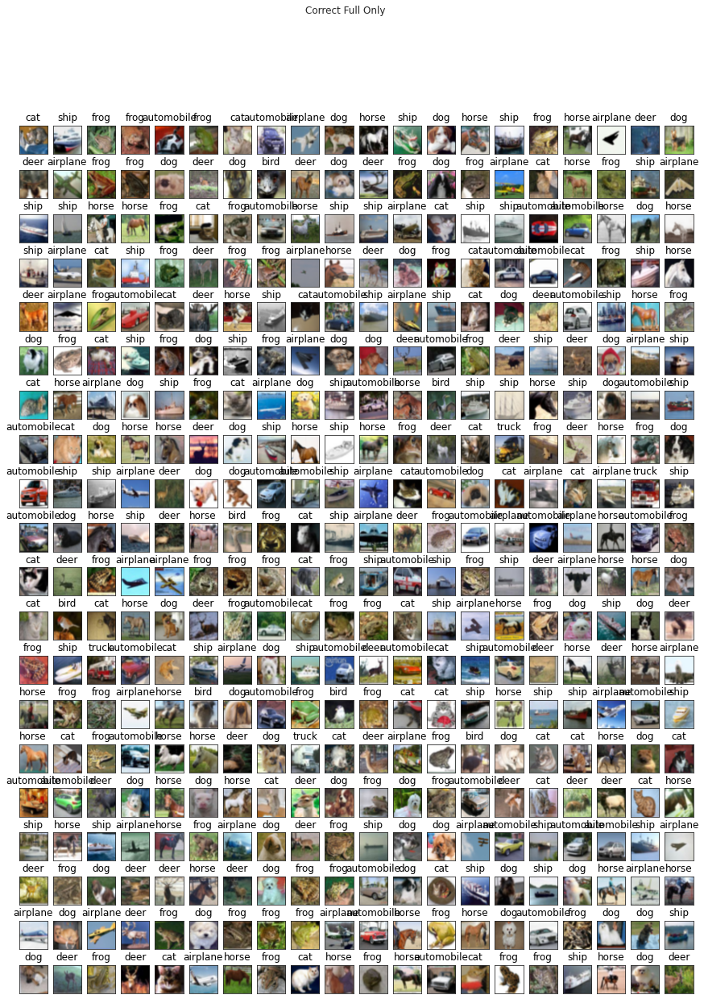

Saved fig at results/error_profiles/imagenet/inputs_correct_head1_resnet50-nonrob-frac-0.00050-ft-cifar10.png


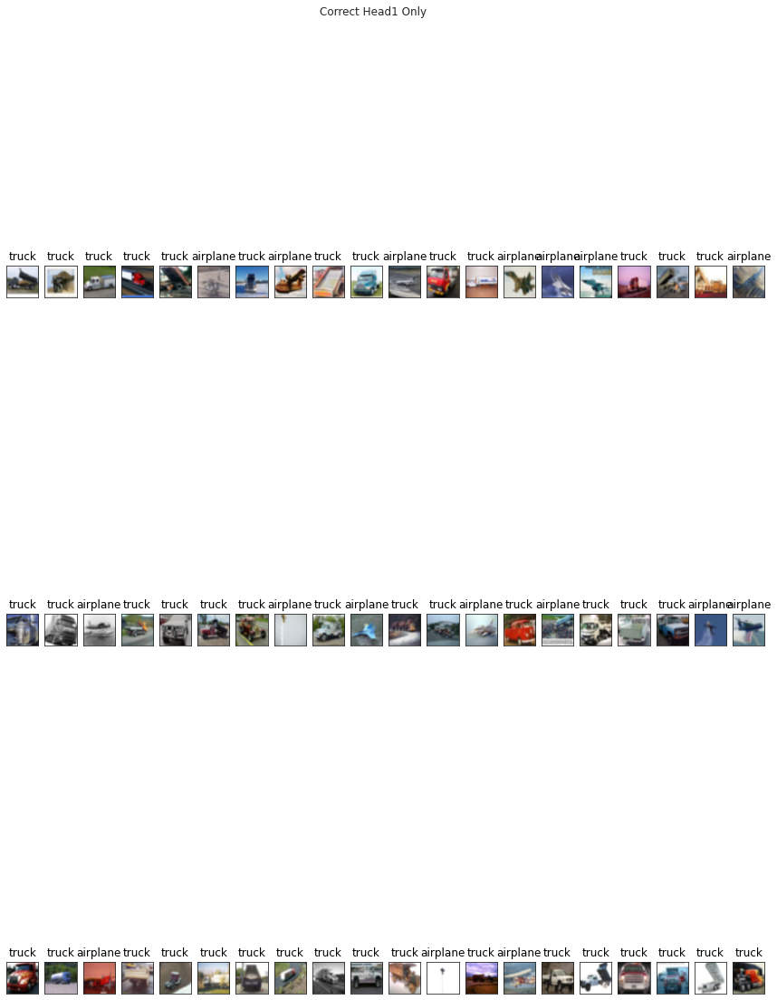

Saved fig at results/error_profiles/imagenet/inputs_correct_head2_resnet50-nonrob-frac-0.00050-ft-cifar10.png


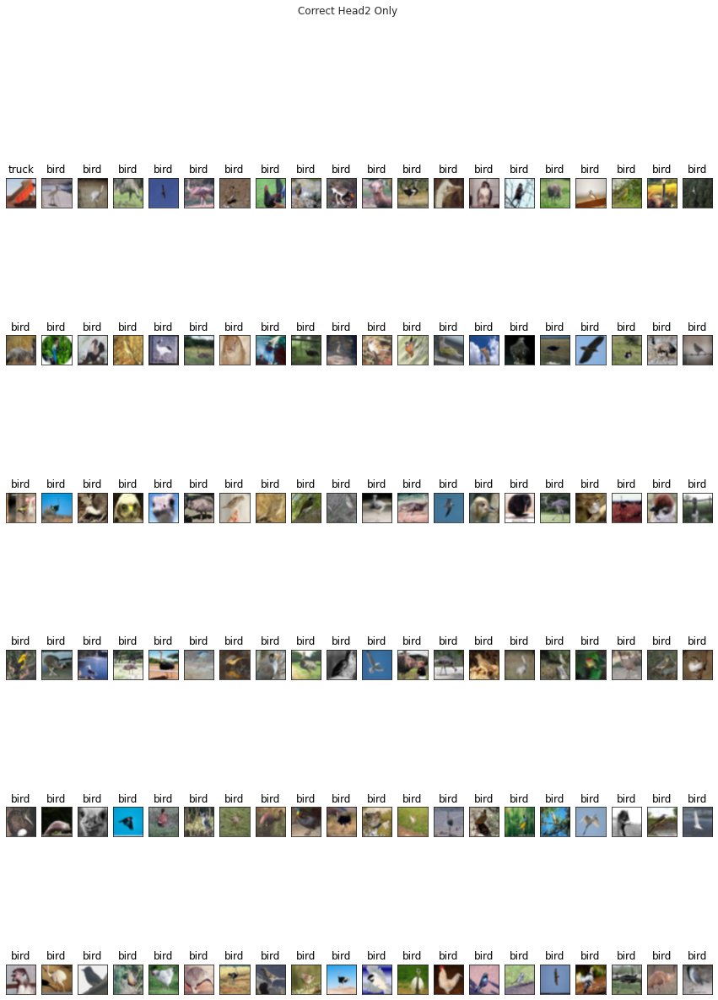

Global seed set to 2
Global seed set to 2
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Global seed set to 0
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

For resnet50-nonrob on cifar10, frac=0.001 Test acc partial heads: 0.17020000517368317, 0.13439999520778656; full head: 0.8913999795913696
Saved fig at results/error_profiles/imagenet/inputs_correct_fullonly_resnet50-nonrob-frac-0.00100-ft-cifar10.png


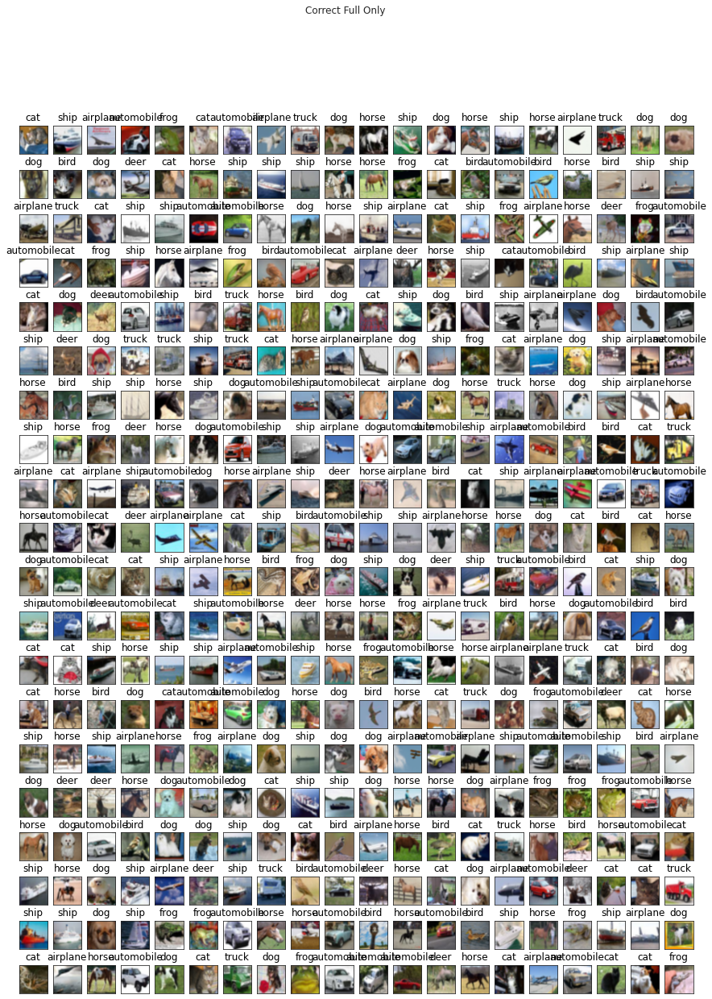

Saved fig at results/error_profiles/imagenet/inputs_correct_head1_resnet50-nonrob-frac-0.00100-ft-cifar10.png


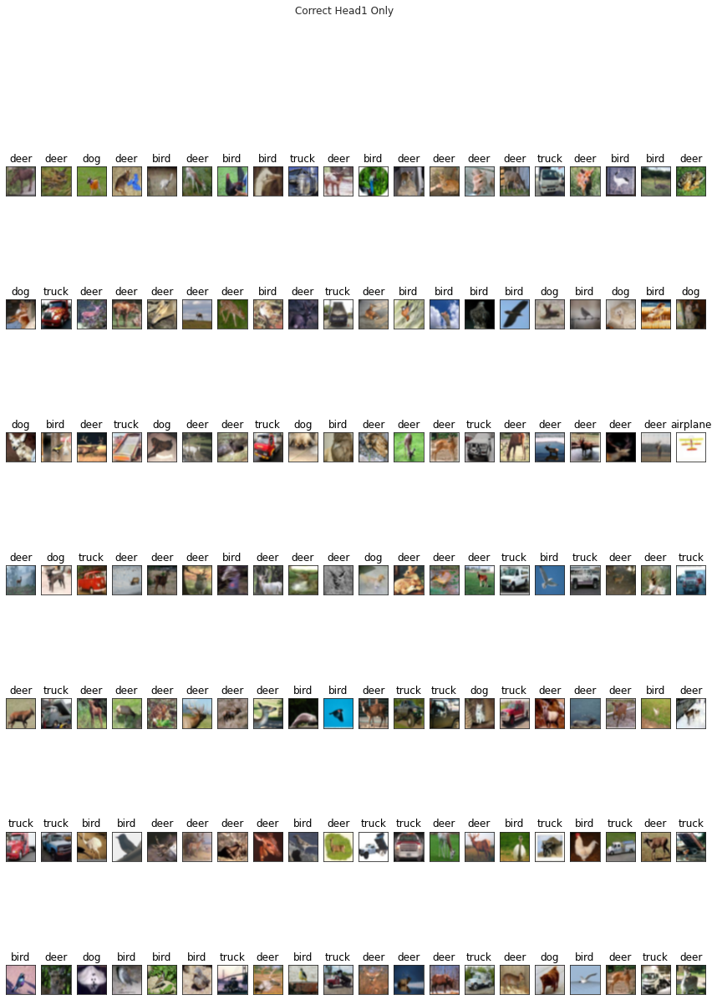

Saved fig at results/error_profiles/imagenet/inputs_correct_head2_resnet50-nonrob-frac-0.00100-ft-cifar10.png


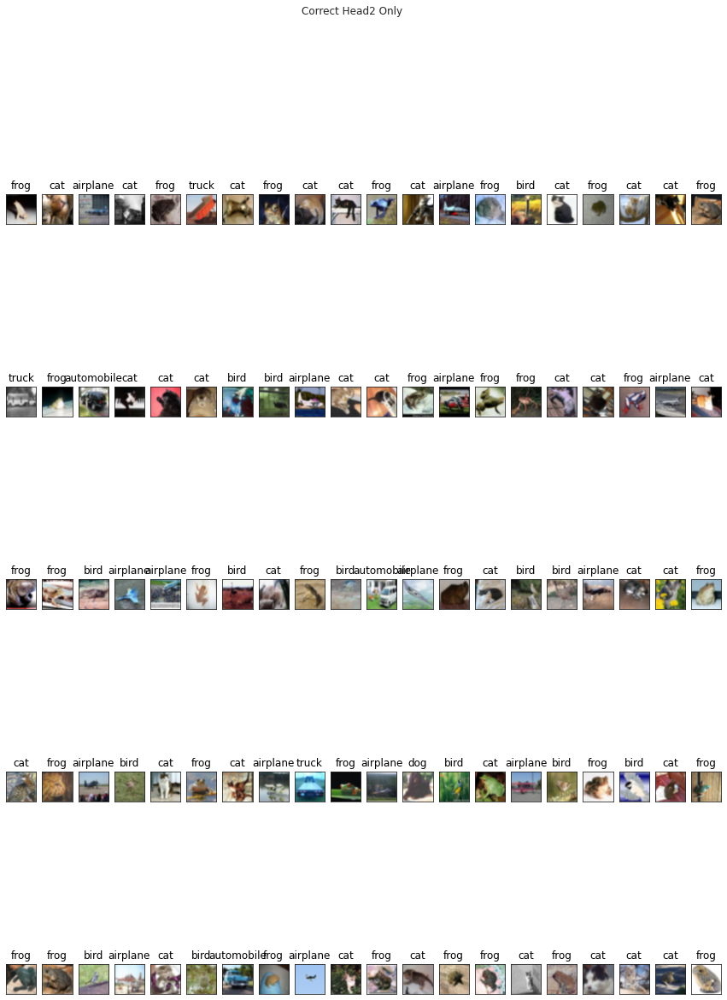

Global seed set to 2
Global seed set to 2
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Global seed set to 0
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

For resnet50-nonrob on cifar10, frac=0.002 Test acc partial heads: 0.1703999936580658, 0.19599999487400055; full head: 0.8913999795913696
Saved fig at results/error_profiles/imagenet/inputs_correct_fullonly_resnet50-nonrob-frac-0.00200-ft-cifar10.png


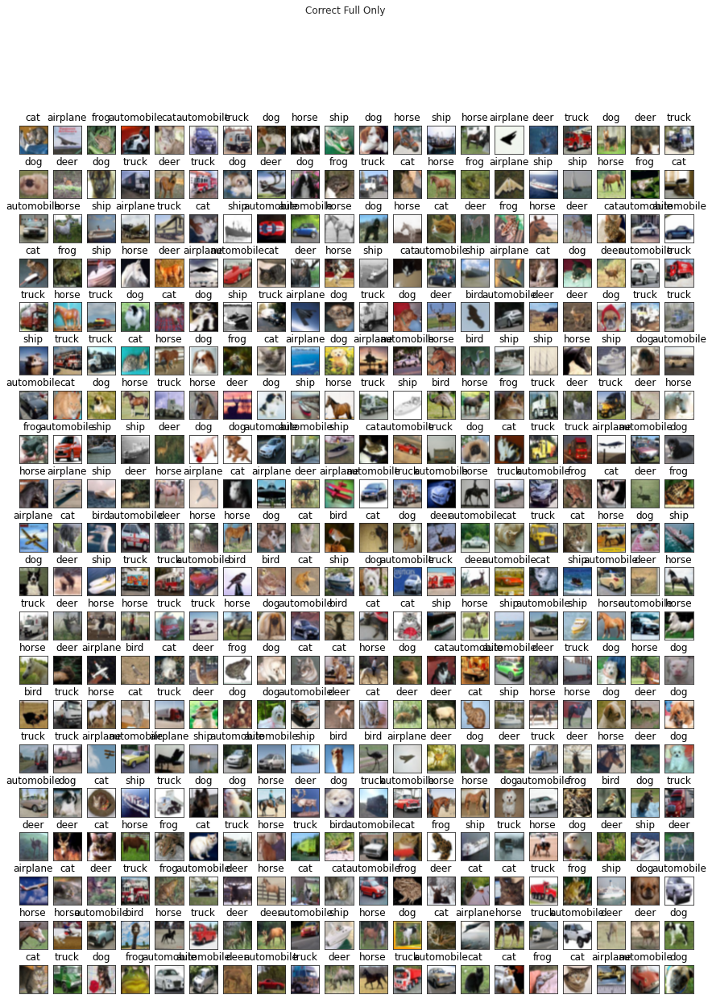

Saved fig at results/error_profiles/imagenet/inputs_correct_head1_resnet50-nonrob-frac-0.00200-ft-cifar10.png


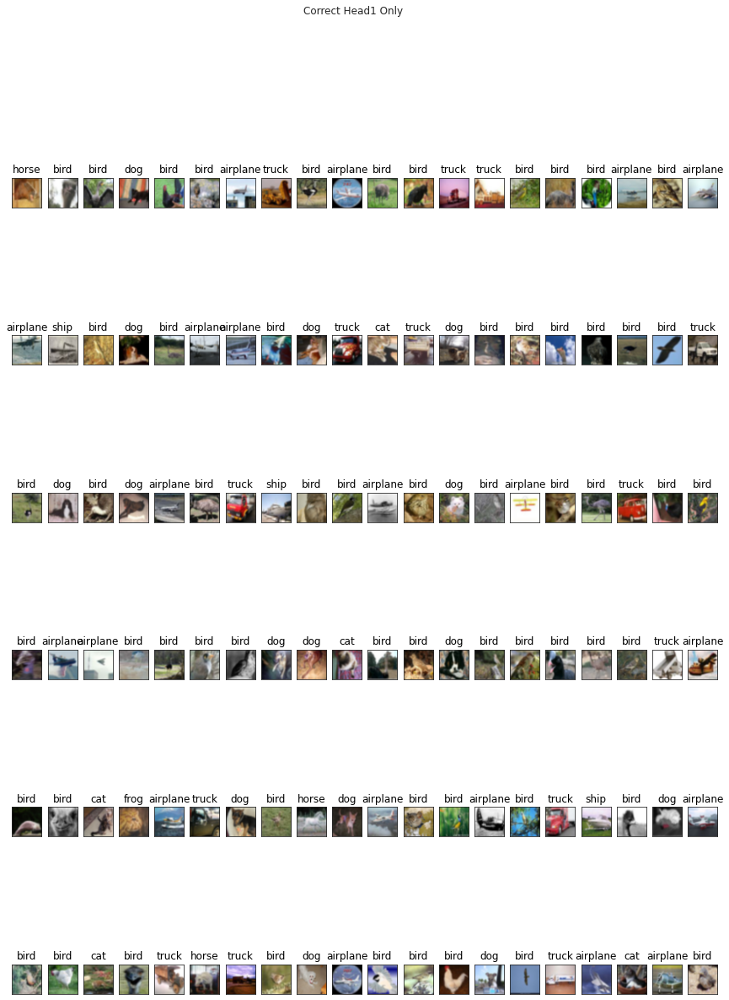

Saved fig at results/error_profiles/imagenet/inputs_correct_head2_resnet50-nonrob-frac-0.00200-ft-cifar10.png


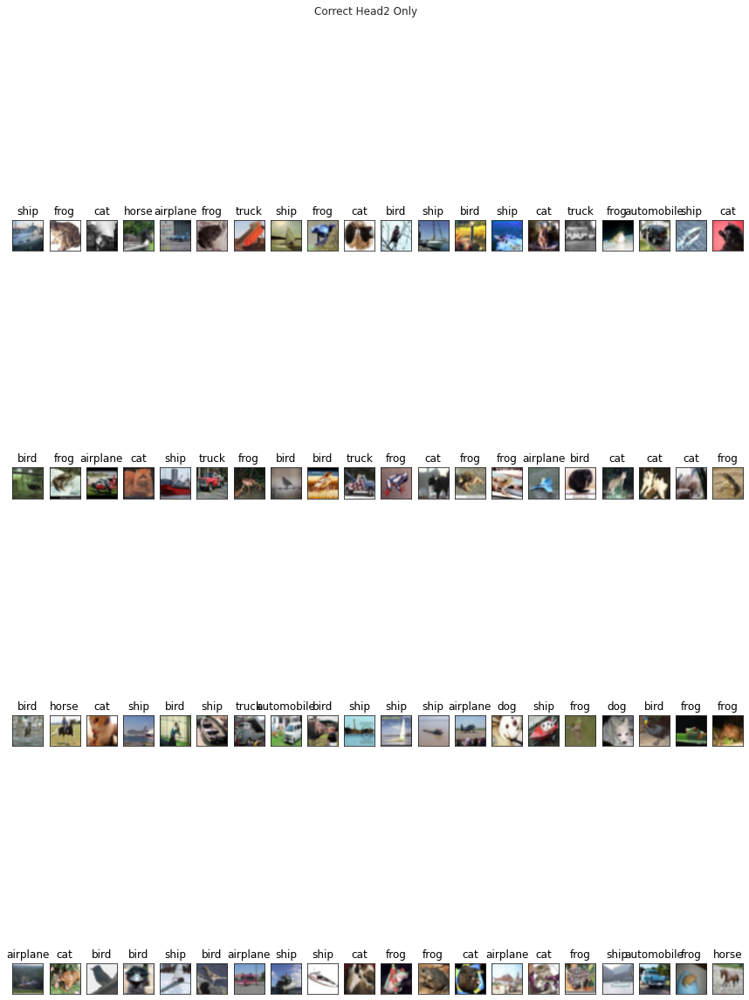

Global seed set to 2
Global seed set to 2
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Global seed set to 0
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

For resnet50-nonrob on cifar10, frac=0.003 Test acc partial heads: 0.19509999454021454, 0.25839999318122864; full head: 0.8913999795913696
Saved fig at results/error_profiles/imagenet/inputs_correct_fullonly_resnet50-nonrob-frac-0.00300-ft-cifar10.png


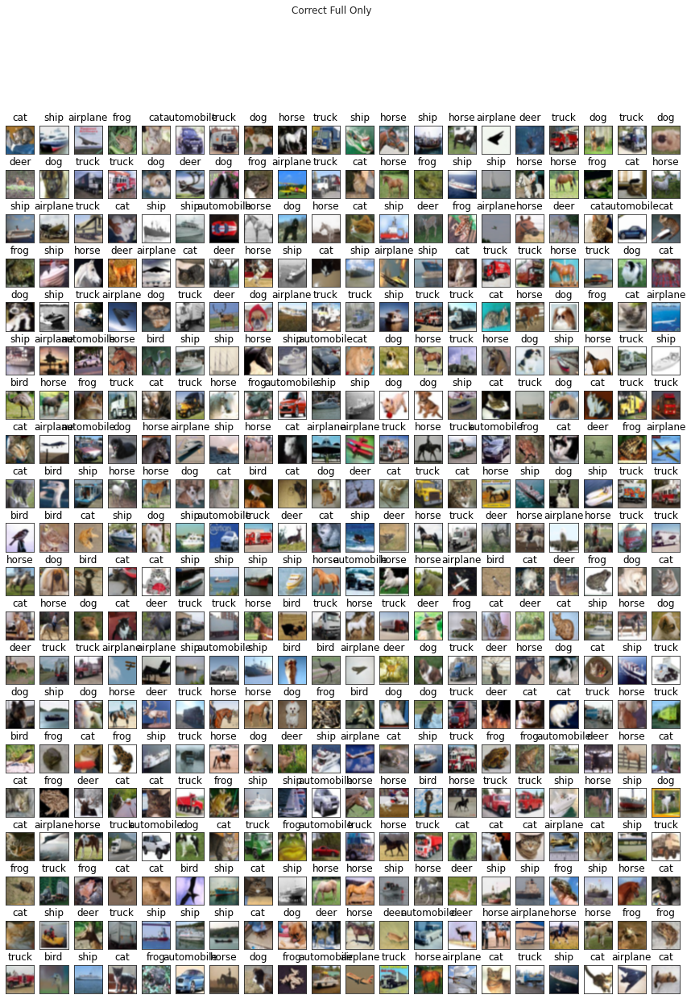

Saved fig at results/error_profiles/imagenet/inputs_correct_head1_resnet50-nonrob-frac-0.00300-ft-cifar10.png


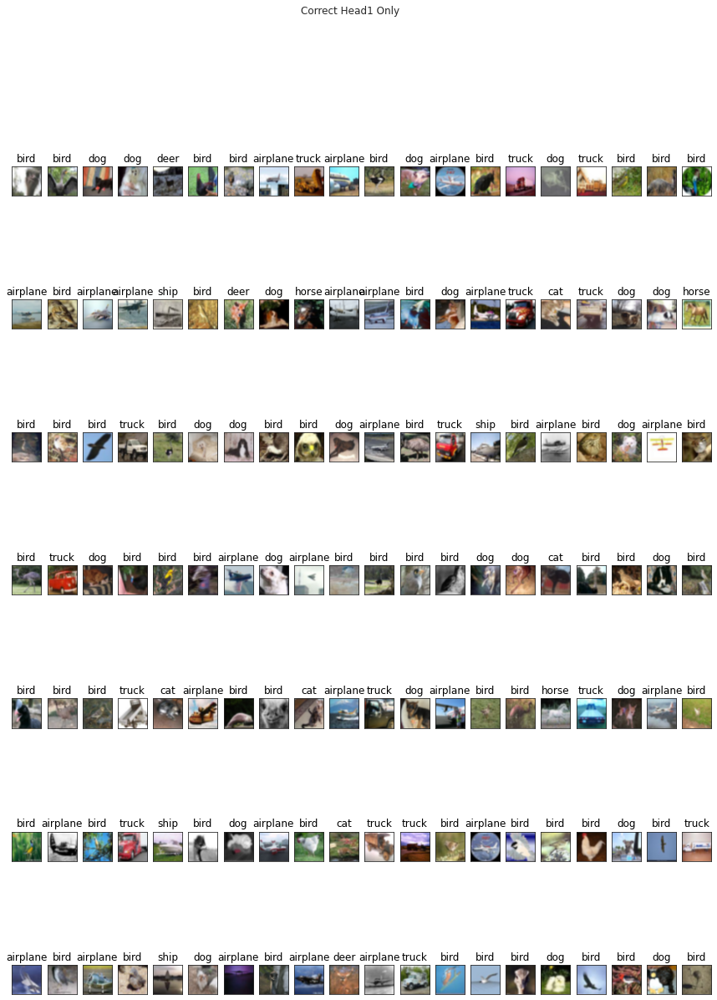

Saved fig at results/error_profiles/imagenet/inputs_correct_head2_resnet50-nonrob-frac-0.00300-ft-cifar10.png


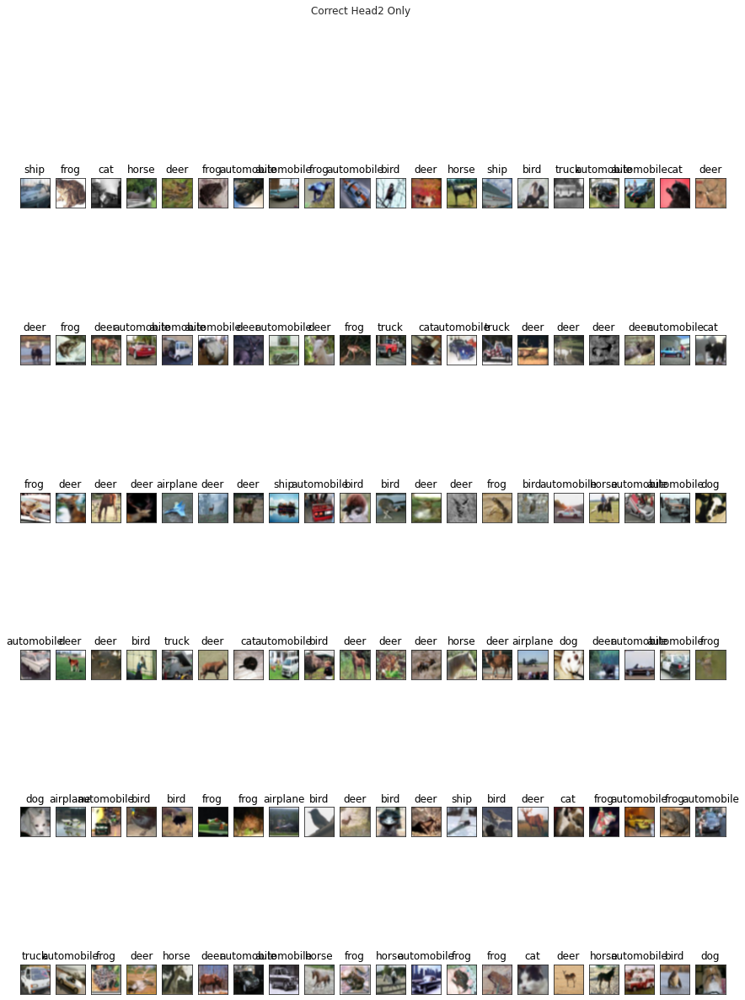

Global seed set to 2
Global seed set to 2
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Global seed set to 0
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [4]


Predicting: 0it [00:00, ?it/s]

For resnet50-nonrob on cifar10, frac=0.004 Test acc partial heads: 0.20909999310970306, 0.27250000834465027; full head: 0.8913999795913696
Saved fig at results/error_profiles/imagenet/inputs_correct_fullonly_resnet50-nonrob-frac-0.00400-ft-cifar10.png


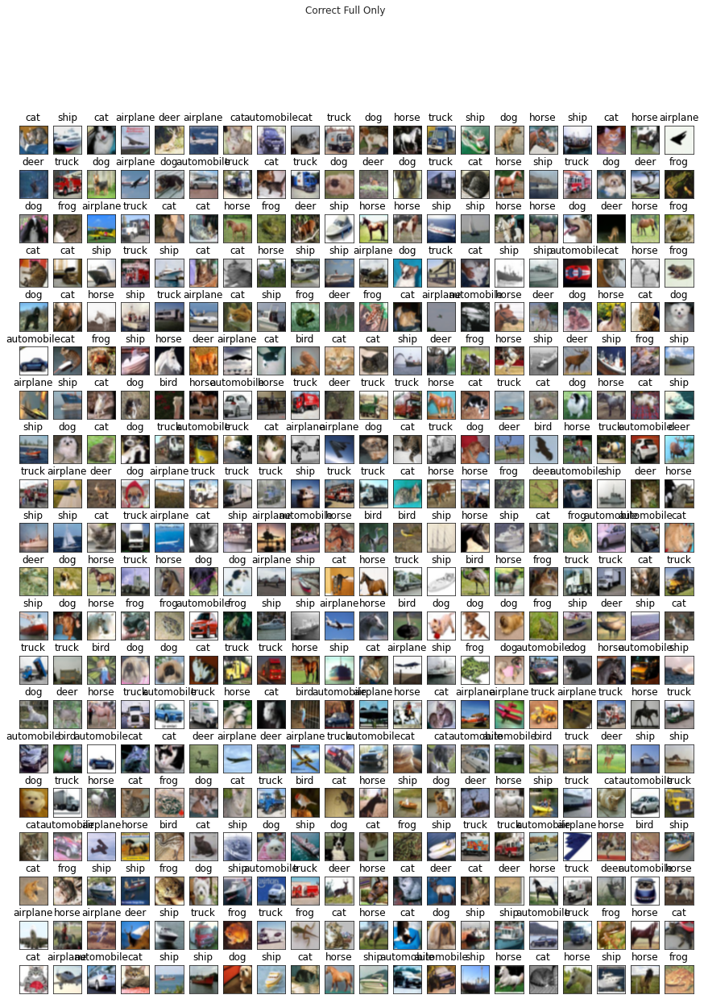

Saved fig at results/error_profiles/imagenet/inputs_correct_head1_resnet50-nonrob-frac-0.00400-ft-cifar10.png


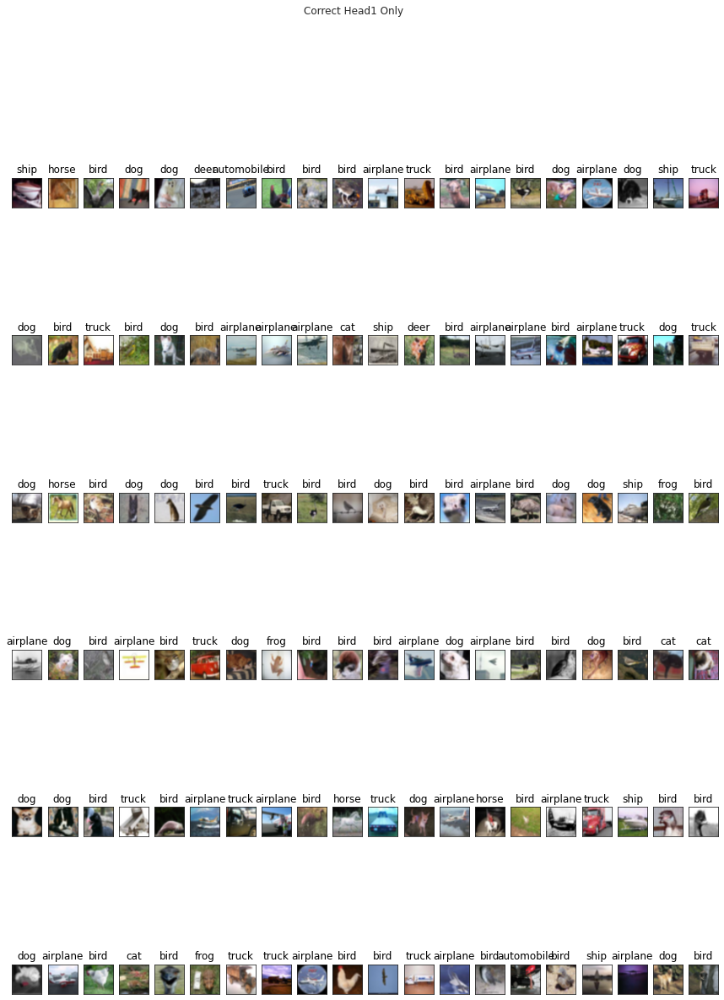

Saved fig at results/error_profiles/imagenet/inputs_correct_head2_resnet50-nonrob-frac-0.00400-ft-cifar10.png


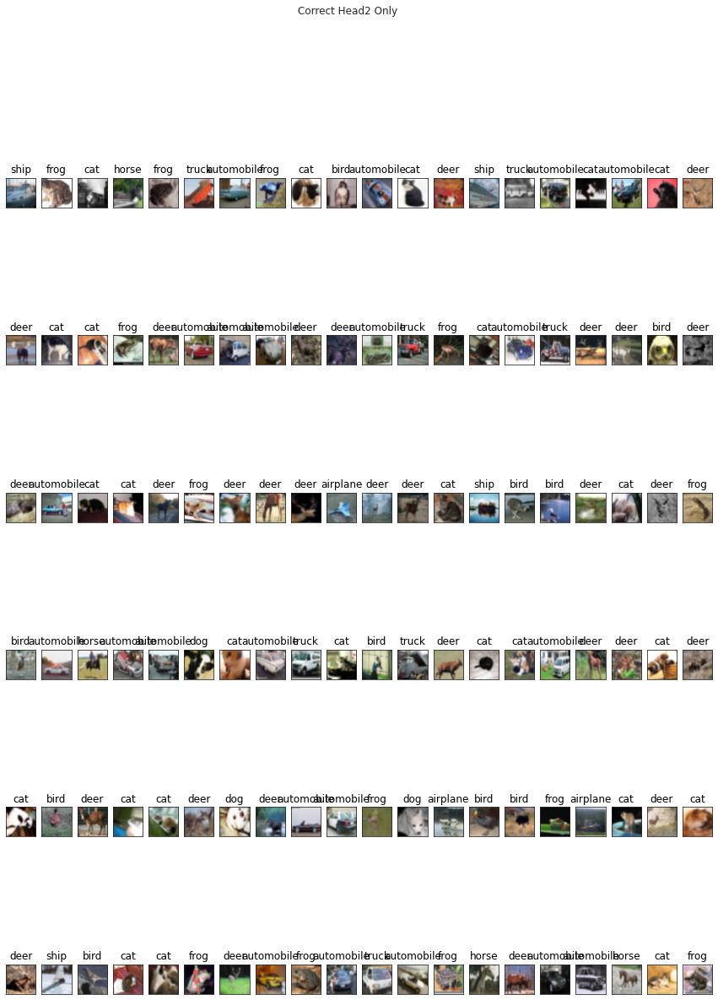

Global seed set to 2
Global seed set to 2
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
Global seed set to 0


In [ ]:
SOURCE_DATASET = 'imagenet'
MODEL = 'resnet50'
results(MODEL, SOURCE_DATASET)

In [ ]:
SOURCE_DATASET = 'imagenet21k'
MODEL = 'vit_small_patch16_224'
results(MODEL, SOURCE_DATASET)

In [ ]:
SOURCE_DATASET = 'imagenet21k'
MODEL = 'vit_small_patch16_224'
results(MODEL, SOURCE_DATASET)

In [ ]:
SOURCE_DATASET = 'imagenet'
MODEL = 'resnet50_mrl'
results(MODEL, SOURCE_DATASET)